Batch correction module across different technologies. The processed data can be found at https://zenodo.org/records/10988053.

In [ ]:
import scanpy as sc
import numpy as np
import sctm
import squidpy as sq
import pandas as pd
import seaborn as sns
import anndata as ad

%load_ext autoreload
%autoreload 2

In [ ]:
adata = sc.read_h5ad(
    "../../../../STAMP/Reproducibility/ProcessedData/Stereo_MOB/adata_processed.h5ad"
)
adata.var_names_make_unique()

In [ ]:
adata_visium = adata[adata.obs.batch == "visium"]
adata_stereo = adata[adata.obs.batch == "stereo"]
adata_slide = adata[adata.obs.batch == "slide"]


def rotateMatrix(a):
    return np.array([[np.cos(a), -np.sin(a)], [np.sin(a), np.cos(a)]])
adata_visium.obsm['spatial'] = adata_visium.obsm['spatial'] @ rotateMatrix(4.6)
adata_slide.obsm['spatial'] = adata_slide.obsm['spatial'] @ rotateMatrix(1.2)

In [ ]:
sctm.pl.spatial(adata_visium, size = 50, color = "n_genes_by_counts", vmax = 'p99')
sctm.pl.spatial(adata_stereo, size = 2, color = "n_genes_by_counts", vmax = 'p99')
sctm.pl.spatial(adata_slide, size = 3, color = "n_genes_by_counts", vmax = 'p99')

In [ ]:
# # Use hvgs
sctm.seed.seed_everything(3)

model = sctm.stamp.STAMP(
    adata[:, adata.var.highly_variable],
    n_topics=12,
    categorical_covariate_keys=["batch"],
    layer="count",
    gene_likelihood="nb",
    dropout = 0.1,
)
model.train(batch_size = 4096)
# model.save("models/Stereoseq_spatial_final12.pth")
# model.load("models/Stereoseq_spatial_final12.pth")

In [139]:
topic_prop = model.get_cell_by_topic()
beta = model.get_feature_by_topic()

for i in range(1, 12 + 1):
    adata_visium.obs[f"Topic{i}"] = topic_prop[[f"Topic{i}"]]
    adata_stereo.obs[f"Topic{i}"] = topic_prop[[f"Topic{i}"]]
    adata_slide.obs[f"Topic{i}"] = topic_prop[[f"Topic{i}"]]
    adata.obs[f"Topic{i}"] = topic_prop[[f"Topic{i}"]]

top_genes = []
for i in topic_prop.columns:
    top_genes += beta.nlargest(1, i).index.tolist()

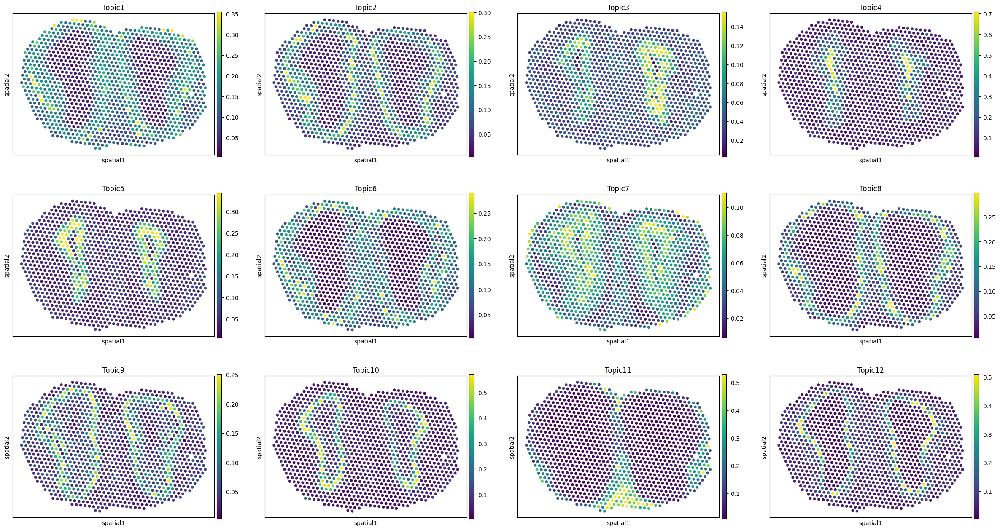

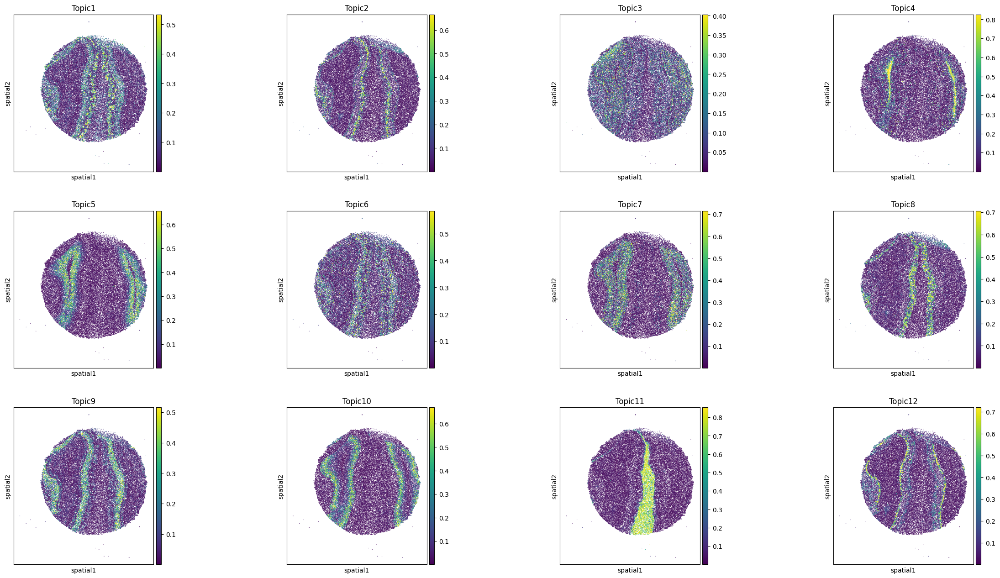

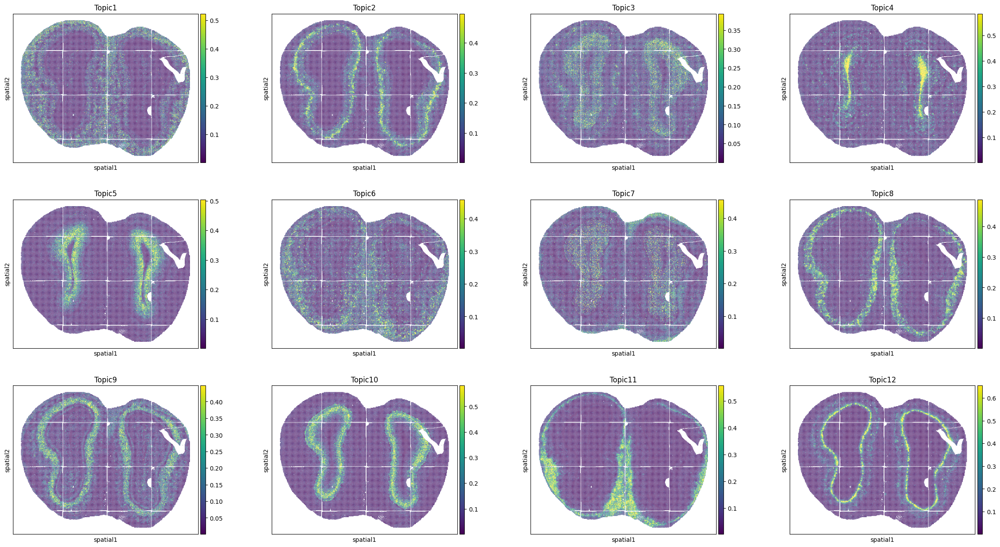

In [140]:
sctm.pl.spatial(adata_visium, color = topic_prop.columns, size = 100, vmax = 'p99')
sctm.pl.spatial(adata_slide, color = topic_prop.columns, size = 3, vmax = 'p99')
sctm.pl.spatial(adata_stereo, color = topic_prop.columns, size = 2, vmax = 'p99')

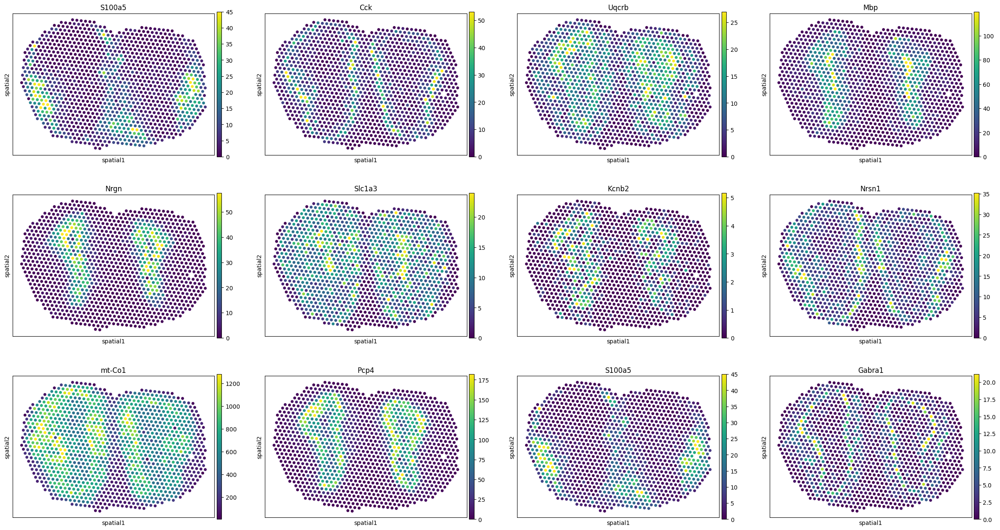

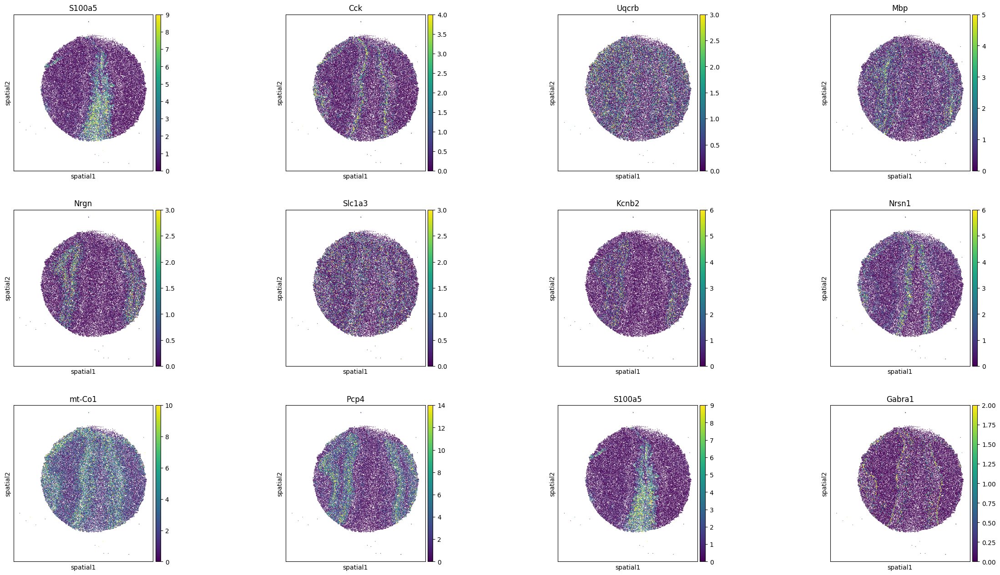

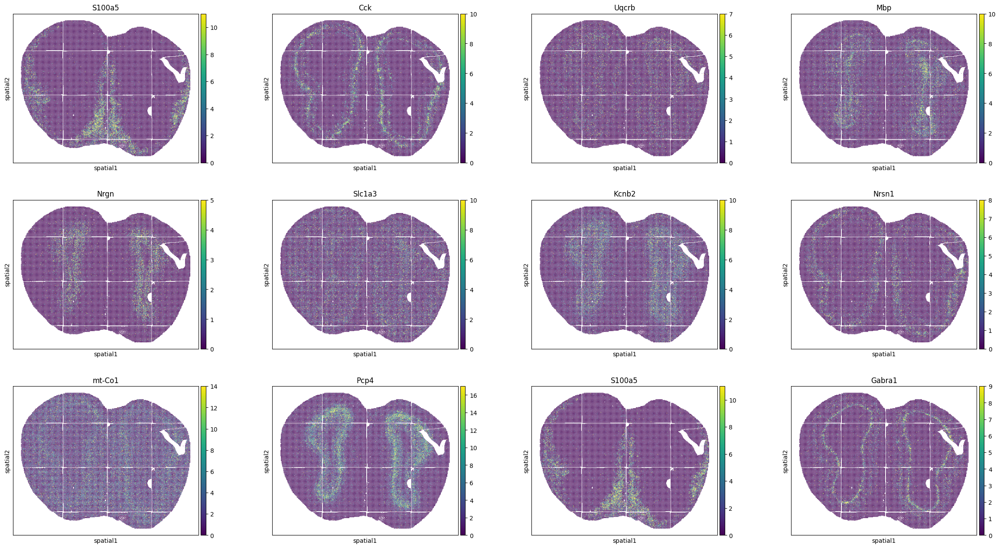

In [142]:
sctm.pl.spatial(adata_visium, color = top_genes, size = 100, vmax = 'p99')
sctm.pl.spatial(adata_slide, color = top_genes, size = 3, vmax = 'p99')
sctm.pl.spatial(adata_stereo, color = top_genes, size = 2, vmax = 'p99')

In [145]:
adata.obsm['X_stamp'] = topic_prop.values

In [148]:
# We use hellinger distance here as it is perfect for comparing between distributions
# https://en.wikipedia.org/wiki/Hellinger_distance
sc.pp.neighbors(adata, metric = "hellinger", use_rep = "X_stamp")
sc.tl.umap(adata)

/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/uma

/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


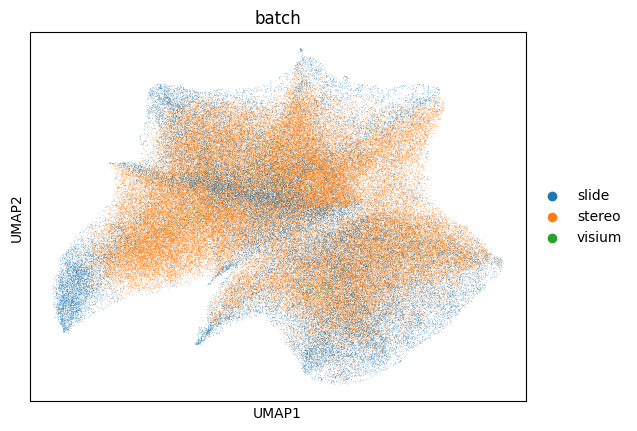

In [150]:
sc.pl.umap(adata, color = 'batch')